# Part 0: Dataloader and Visualizations

In [7]:
import torch
import wandb
import scipy.io

import numpy as np

import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
from torchvision import transforms, datasets
from torch.utils.data import DataLoader

from voc_dataset import VOCDataset

from PIL import Image

from utils import *

USE_WANDB = True

## Editing the Dataloader
The first part of the assignment involves editing the dataloader so that we can access bounding-box proposals as well as the ground-truth bounding boxes. The ground truth bounding box can be accessed through the VOC Dataset annotations itself. Unsupervised bounding box proposals are obtained through methods such as [Selective Search](https://ivi.fnwi.uva.nl/isis/publications/2013/UijlingsIJCV2013/UijlingsIJCV2013.pdf).

Since Selective Search is slow to run on each image, we have pre-computed the bounding box proposals. You should be able to access the `.mat` files using `scipy.io.loadmat('file.mat')`. Feel free to experiment with the data in the files to figure out the number of proposals per image, their scores, etc.

Your task is to change the dataloader to obtain the ground-truth bounding boxes, as well as the proposed bounding boxes for each image. Returning a dictionary would be convenient here. For the bounding boxes, using the relative positions is usually a better idea since they are invariant to changes in the size of the image.

In [8]:
# Load the Dataset - items at a particular index can be accesed by usual indexing notation (dataset[idx])
dataset = VOCDataset('trainval', top_n=10)

In [ ]:
#TODO: get the image information from index 2020
idx = 2020

ret = dataset.__getitem__(idx)

## Wandb Init and Logging
Initialize a Weights and Biases project, and convert the image tensor to a PIL image and plot it (check `utils.py` for helper functions).

You can use [this](https://docs.wandb.ai/library/log) as a reference for logging syntax.

In [10]:
if USE_WANDB:
    wandb.init(project="vlr2", reinit=True)

See this block as an example of plotting the ground truth box for an image.

In [11]:
original_image = tensor_to_PIL(ret['image'])
gt_labels = ret['gt_classes']
gt_boxes = ret['gt_boxes']

class_id_to_label = dict(enumerate(dataset.CLASS_NAMES))

img = wandb.Image(original_image, boxes={
    "predictions": {
        "box_data": get_box_data(gt_labels, gt_boxes),
        "class_labels": class_id_to_label,
    },
})

wandb.log({'gt_boxes' : img})

Check the `get_box_data` function in `utils.py` and understand how it is being used. Log the image with the GT bounding box on wandb.
After, this you should be able to easily plot the top 10 bounding proposals as well.

In [12]:
rois = ret['rois']
nums = [i for i in range(len(rois))] # placeholder for names of proposals
class_labels = dict([(i, str(i)) for i in nums])

#TODO: plot top ten proposals (of bounding boxes)
img = wandb.Image(original_image, boxes={
    "predictions": {
        "box_data": get_box_data(nums, rois),
        "class_labels" : class_labels,
    },
})

wandb.log({'proposal_boxes' : img})

### Q 0.1

The 2020th index image contains a train.

### Q 0.2

We can simply take the top scoring regions of interest

### Q 0.3

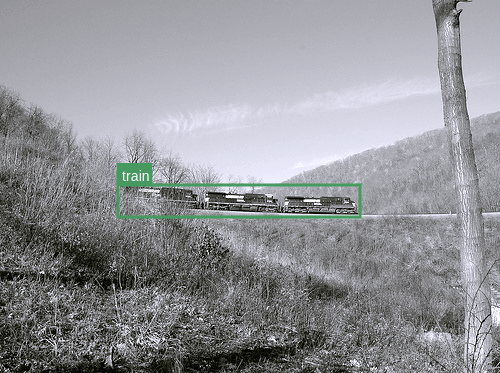

### Q 0.4

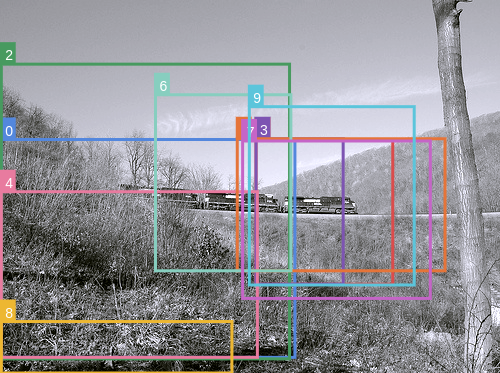

# Part 1: Is Object Localization Free?

### Q 1.1

1. Define Loss function and optimizer: the loss function is the (classification) objective that we train the network on, the optimizer is what we use to optimize the network (lower the loss). I used binary cross entropy and SGD respectively. I also used a reduce LR on plateau learning rate scheduler

2. Create Datasets and Dataloaders: These are the utilities that are required to train and test the network. They make loading the data from files and taking batches of them easy.

3. Create loggers for wandb: wandb is a utility that allows us to easily look through the progress of different model train executions. Here I initialized wandb

4. Get inputs from data dict: Dataloader gives data dict, need to extract components for training from said dict.

5. Get output from the model, perform any necessary functions, compute loss using "criterion": Here we take the output from the convolutional network and turn it into a classification output. This network is specially designed to do this because its last output has the same number of channels as the number of classes. Therefore we only do a maxpool over the entire HxW dimensions of the convolutional output to get a 20x1x1 vector that has our classifiation logits for the 20 classes. I actually just used torch.amax instead of max pool and put the logits through a sigmoid and then into the binary cross entropy loss.

6. Visualize/log things as mentioned in handout: Here I log the train loss, metric1, metric2, and also images and their heatmaps (last convolutional output from the channel corresponding to a class detected in the image)

7. Define model: Here we define the localizer alexnet, the feature extraction portion is the same as normal alexnet except with one less max pool at the end. Then instead of FC layers in the classifier we have more convolutional layers to preserve spacial information

8. Define forward pass: Here I just put the input through the feature extractor and then through the convolutional "classifier" module

9. Initialize weights correctly based on whether it is pretrained or not: If we want it pretrained we take the weights from an AlexNet (through conv5 I believe) and set our model weights equal to those weights. The classifier is different so we use Xavier initialization on those conv net weights.

### Q 1.2

The output resolution of the model is 29x29

### Q 1.3



### Q 1.4

I believe the steep drop of the loss in the beginning is due to the imbalance in the dataset. Each image is pretty sparse with detections, many only have one class and many others only have two. Therefore the large majority of signal is negative which gives the model a "shortcut" to improving its loss by being more pessimistic about its predictions.

### Q 1.5

The first metric is mAP. I implemented both metrics in the task_1.py file.

### Q 1.6

I used a learning rate of 0.1, the train curves are below. My final train loss was 0.04, train metric1 was 0.95, train metric2 was 0.84.

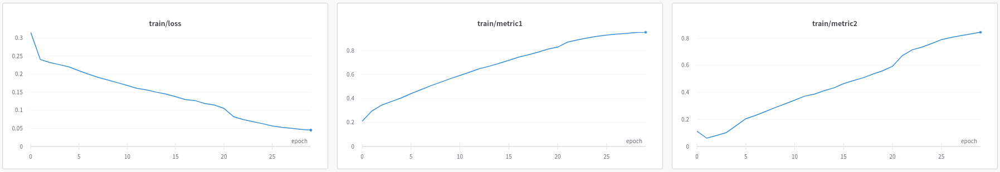

Below are the final validation metric1 and metric2 curves. My final validation metric1 was 0.54 and my validation metric2 was 0.40

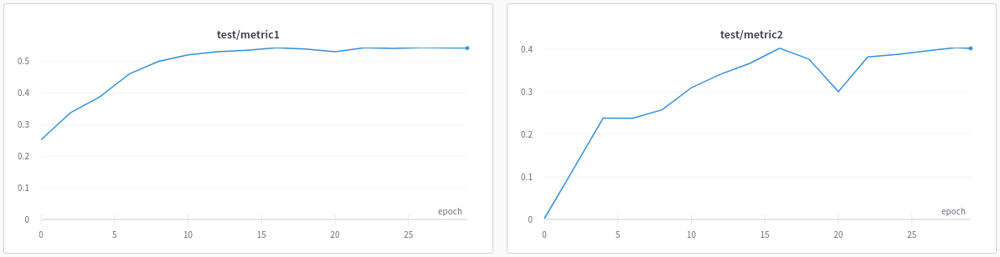

Below are images from the end of the first epoch and their respective heatmaps

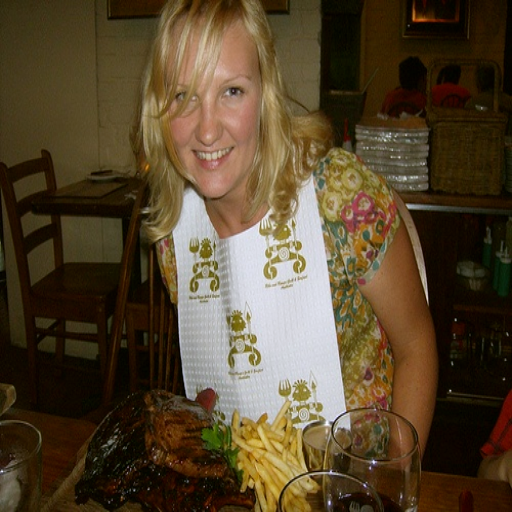

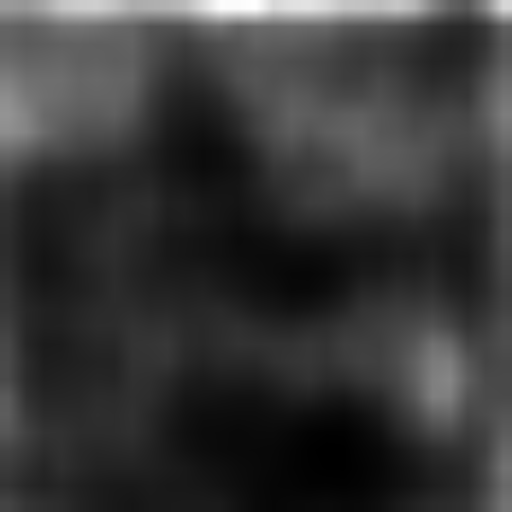

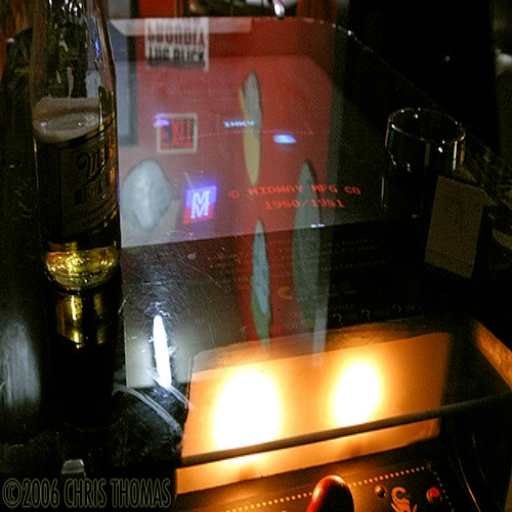

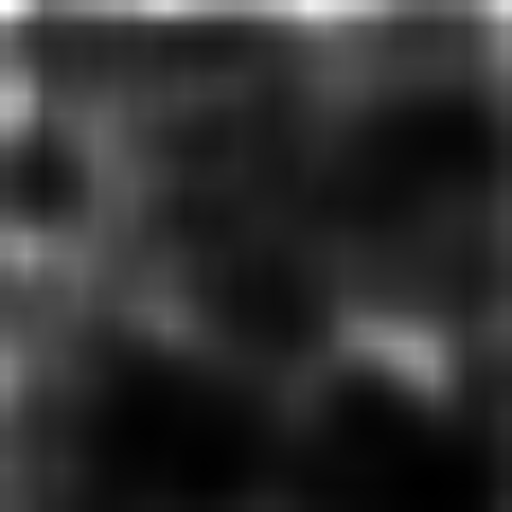

Below are images from the end of the fifteenth epoch and their respective heatmaps

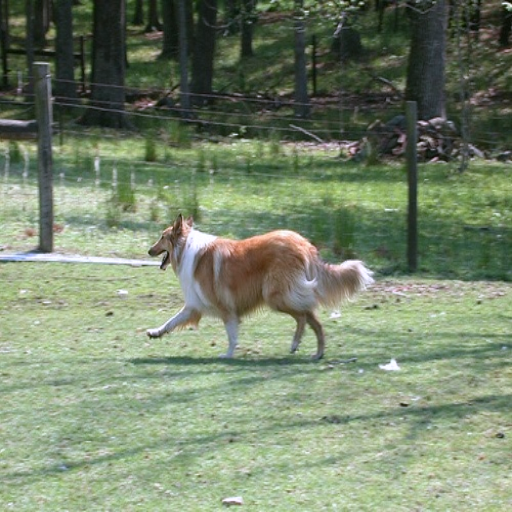

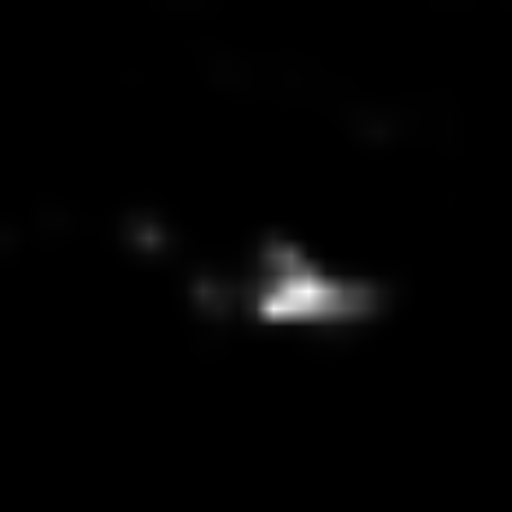

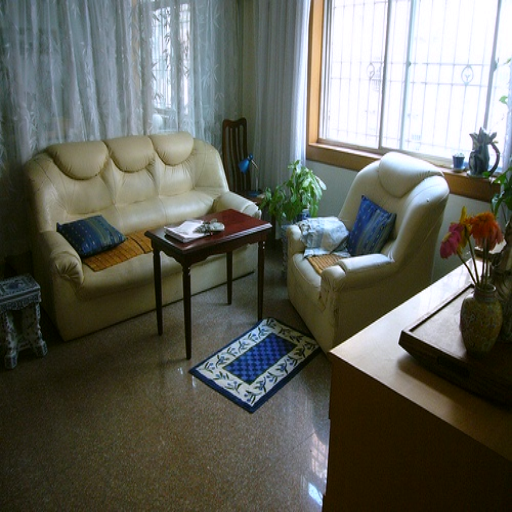

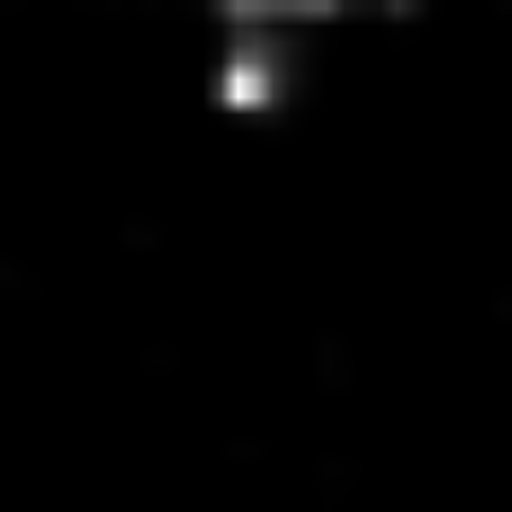

Below are images from the end of the thirtieth epoch and their respective heatmaps

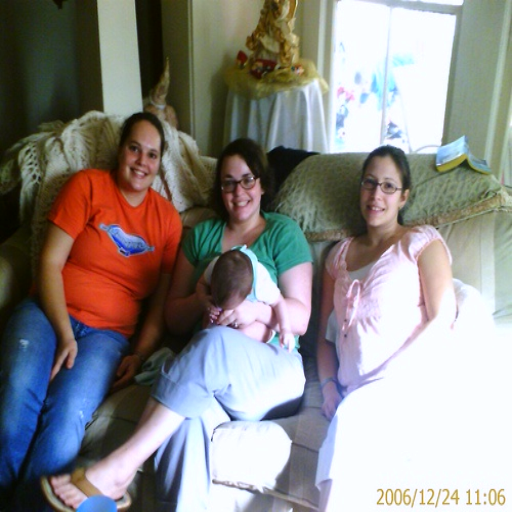

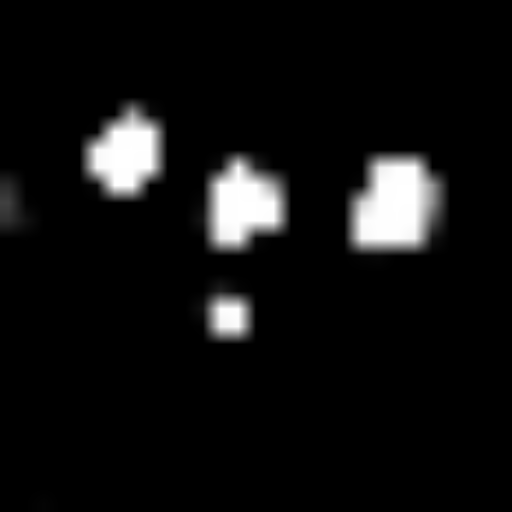

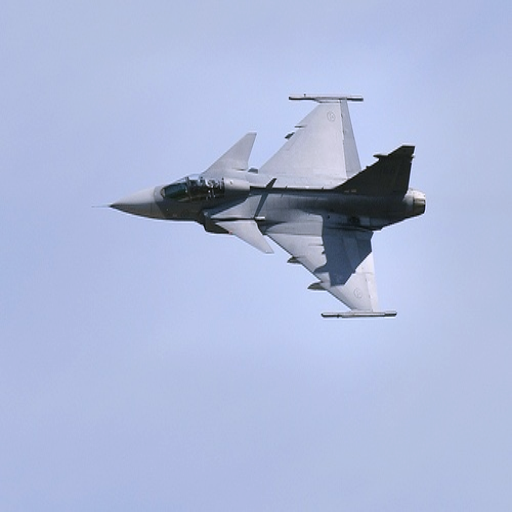

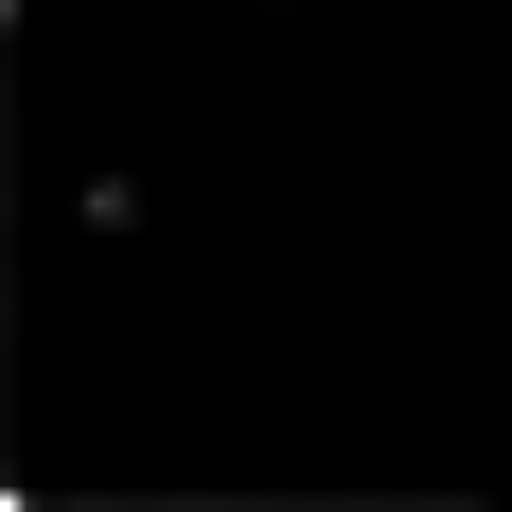

### Q 1.7



To get the effect that we want, where the localizations are not just small salient features, the first thing I thought of was using average pooling to distribute the contributions of small salient features throughout the object. This ended up working, I used average pooling with a kernel size of 5 and a stride of 1 along with (zero) padding 2 directly on the conv output of the classifier, before reducing with max pooling again.

In fact this robust version of the model performed better in terms of both train in test metrics. Its train loss was 0.02, train metric1 was 0.97, train metric2 was 0.90. For validation, metric1 was 0.67, metric2 was 0.55.

Below are images from the end of the first epoch and their respective heatmaps, the first heatmap is from the original LocalizerAlexNet while the second is from the robust version

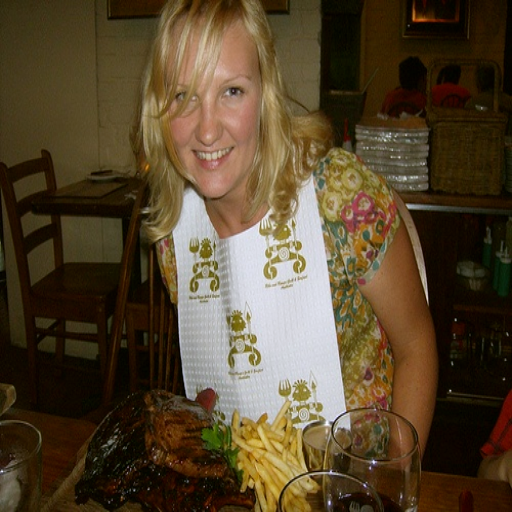

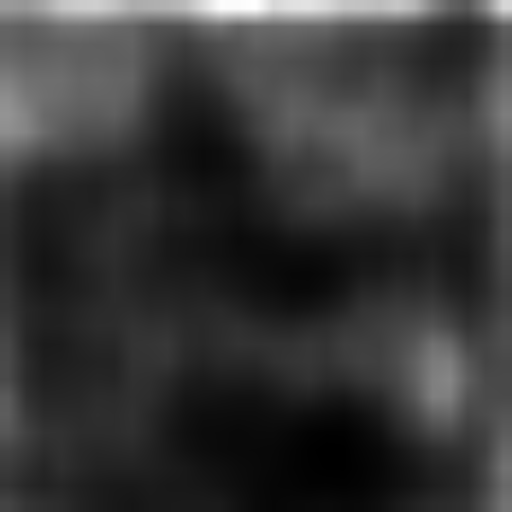

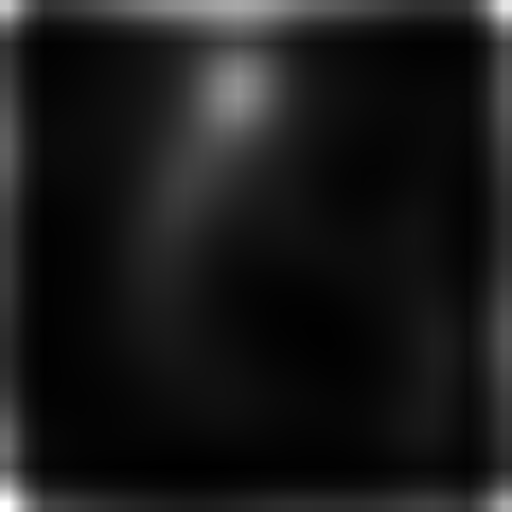

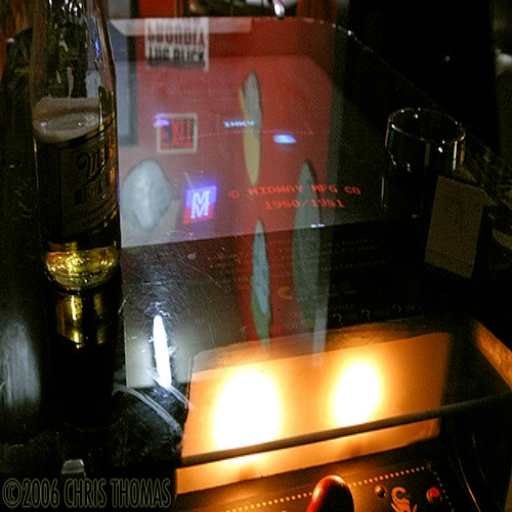

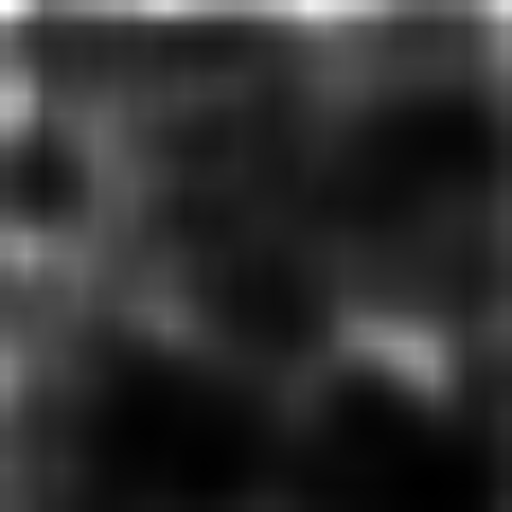

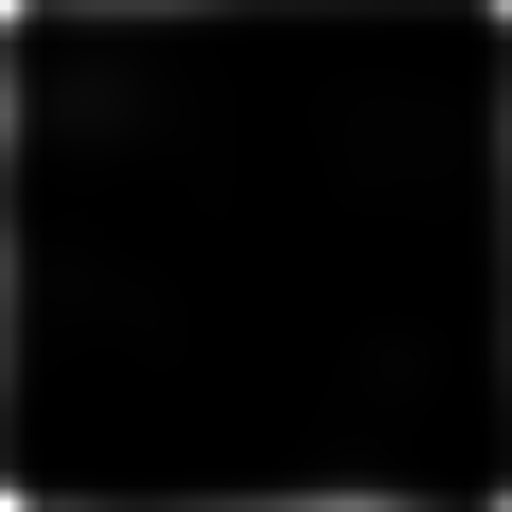

Below are images from the end of the fifteenth epoch and their respective heatmaps, the first heatmap is from the original LocalizerAlexNet while the second is from the robust version

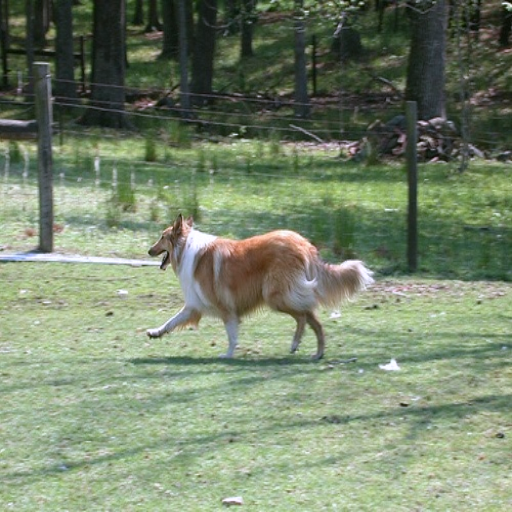

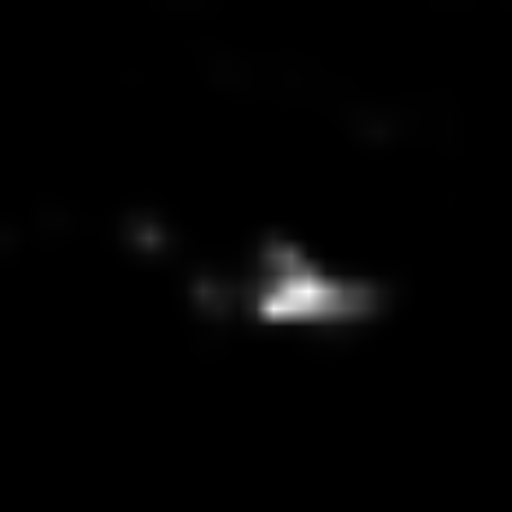

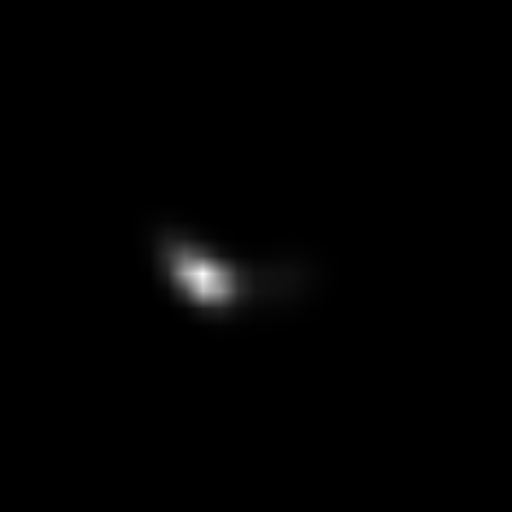

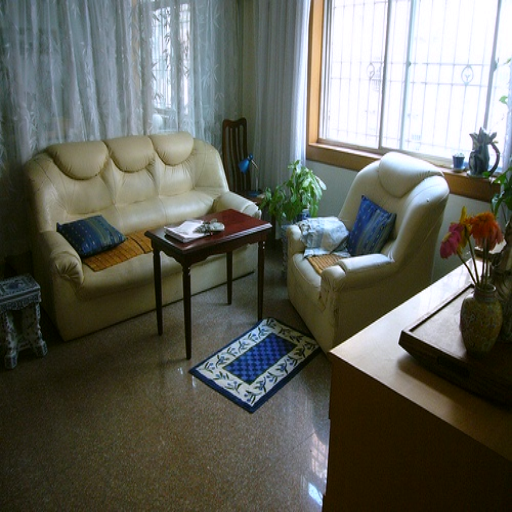

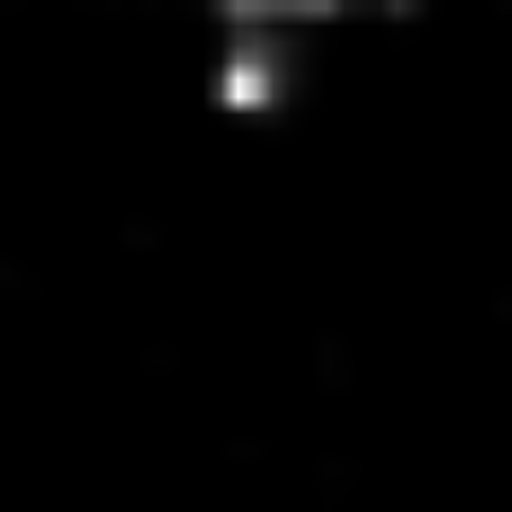

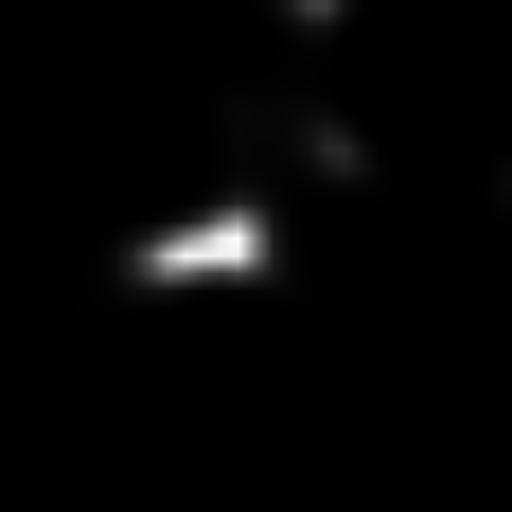

Below are images from the end of the thirtieth epoch and their respective heatmaps, the first heatmap is from the original LocalizerAlexNet while the second is from the robust version

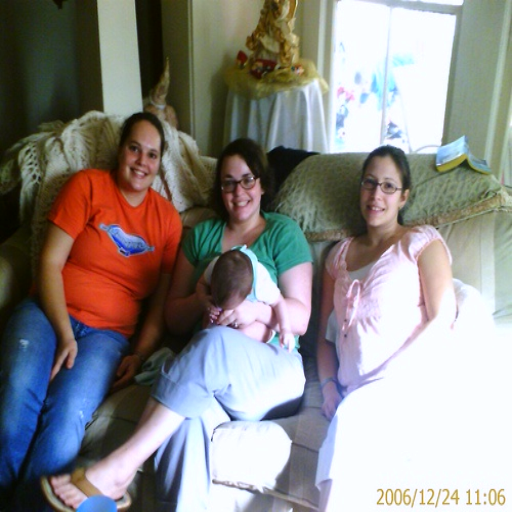

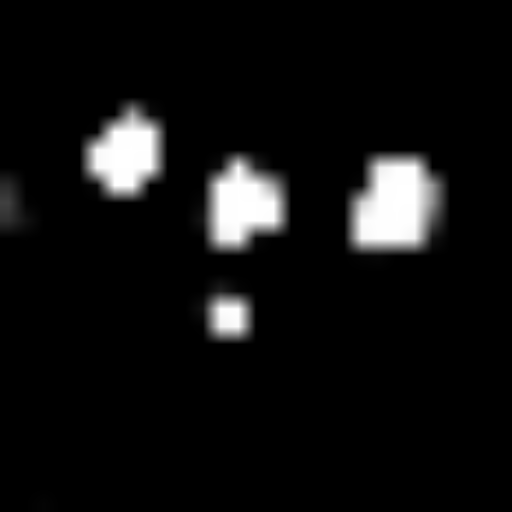

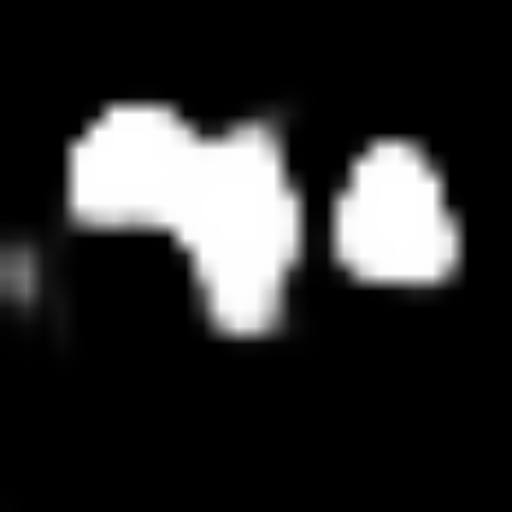

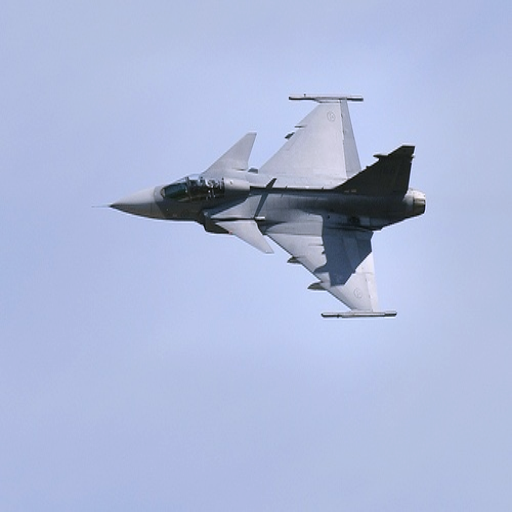

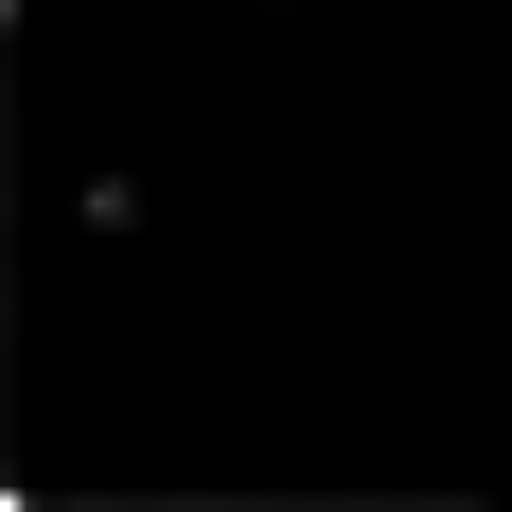

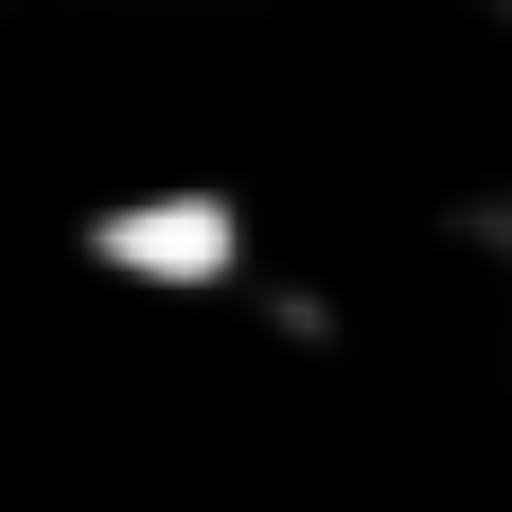

Here are 3 random images from the end of training and their respective heatmaps, the first heatmap is from the original LocalizerAlexNet while the second is from the robust version

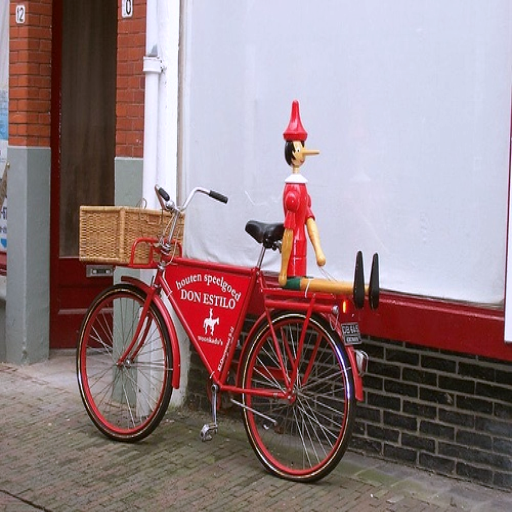

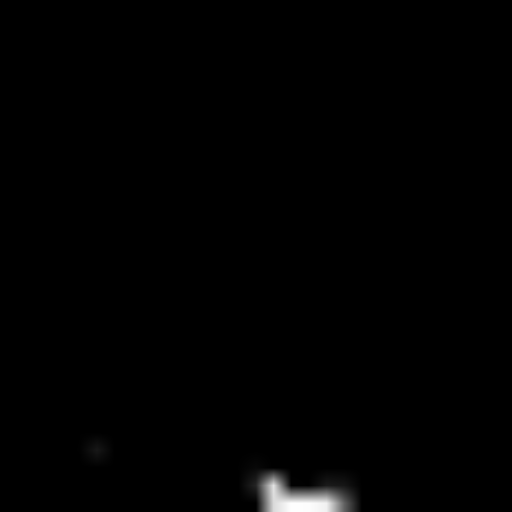

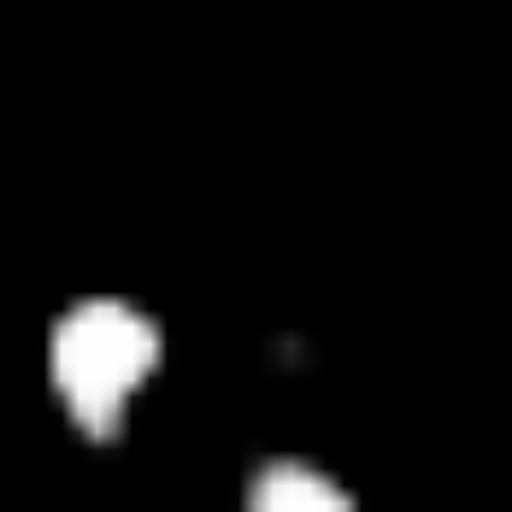

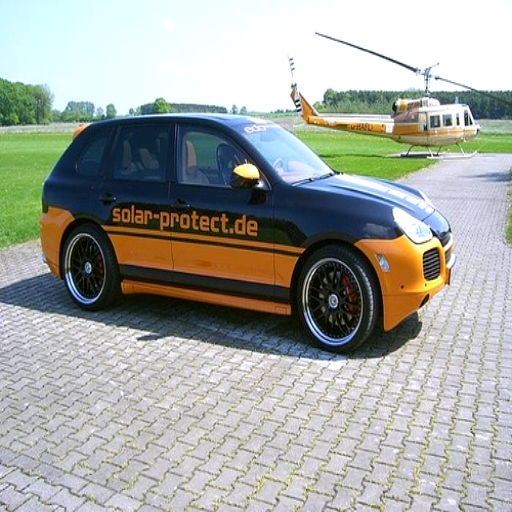

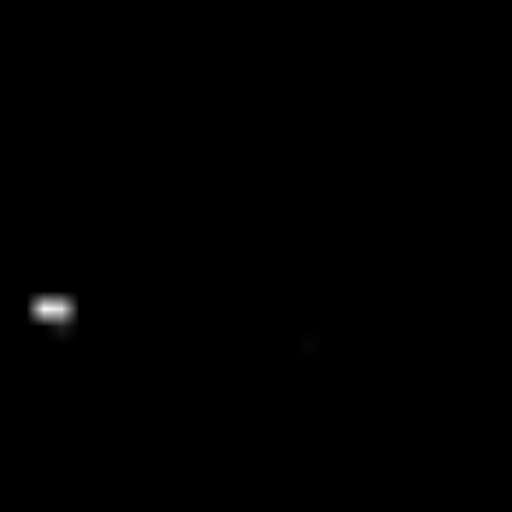

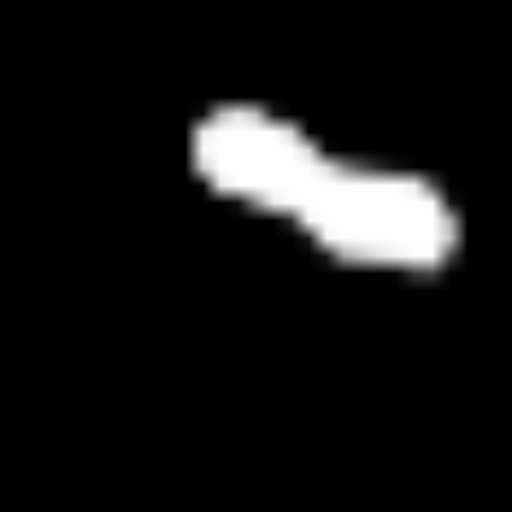

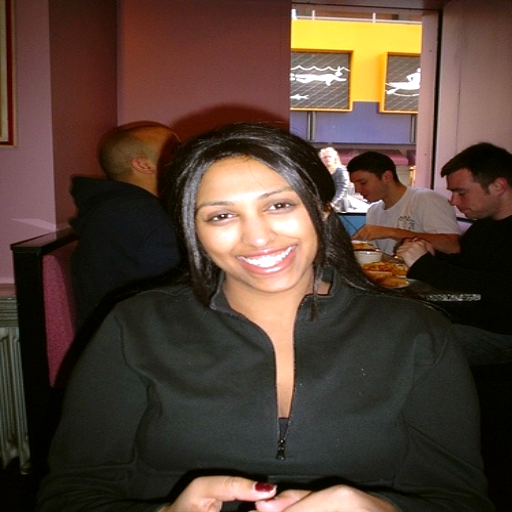

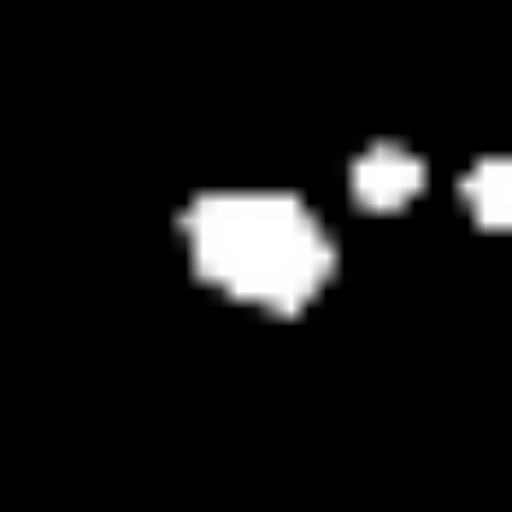

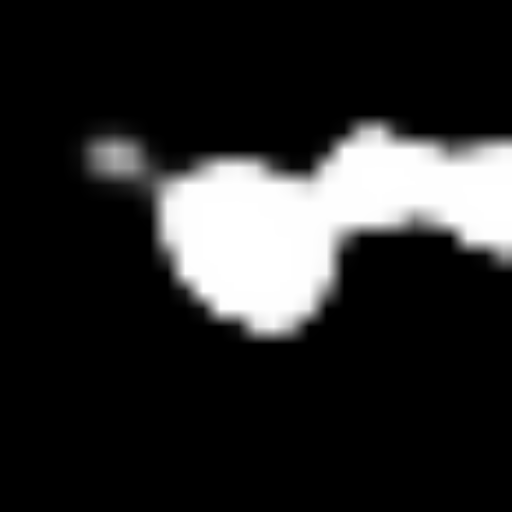

# Part 2: Weakly Supervised Deep Detection Networks

### Q2.4

Below is the value of the training loss over time, logged every 500 iterations over a total of 6 epochs

Below is the mAP over time

Below is the AP over time for some selected classes

Below are some of the classifications after the first epoch of training

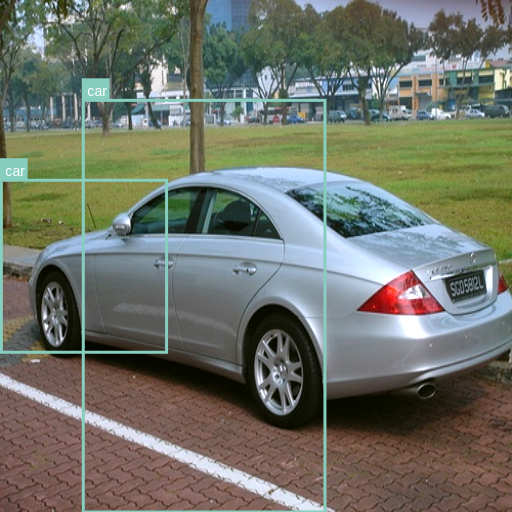

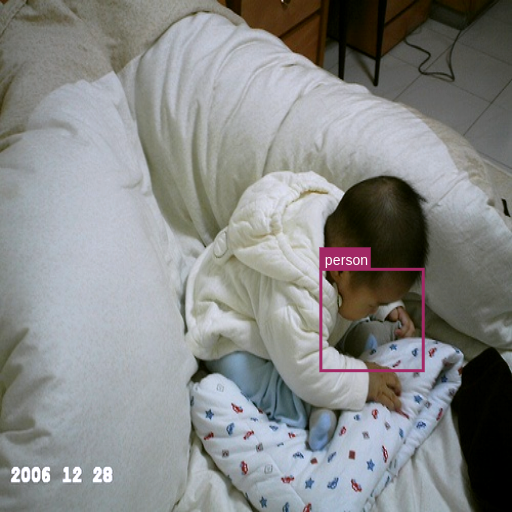

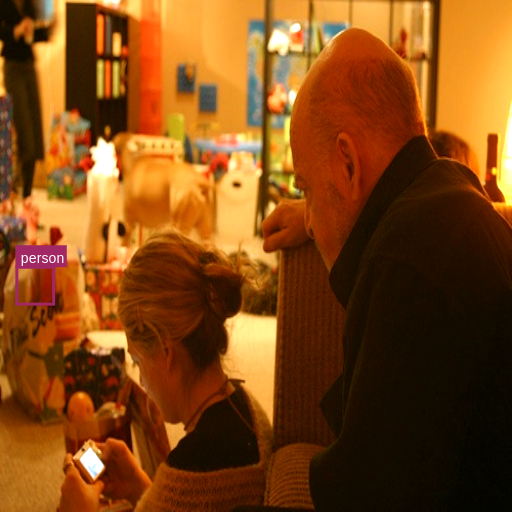

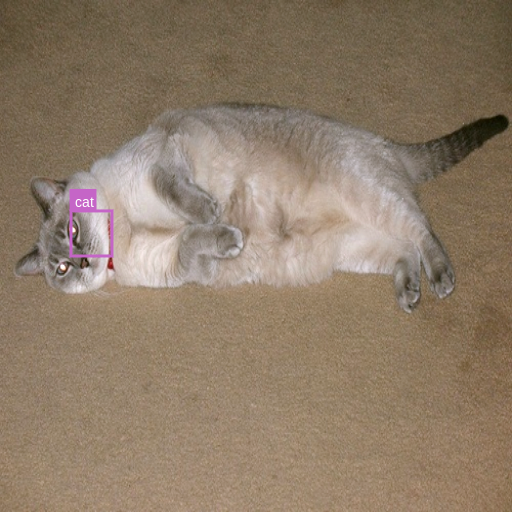

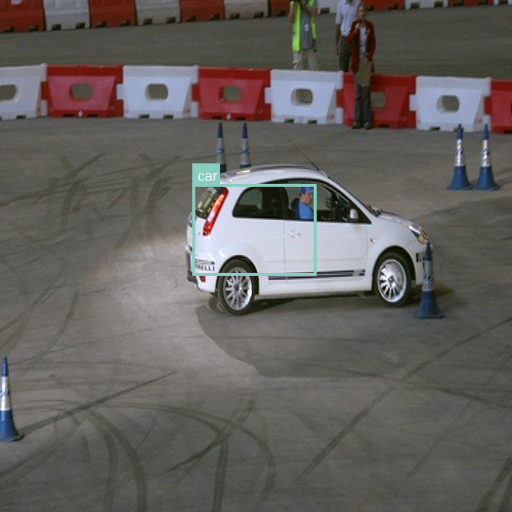

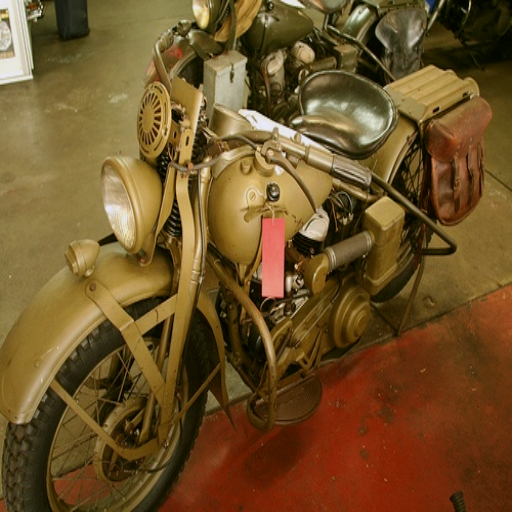

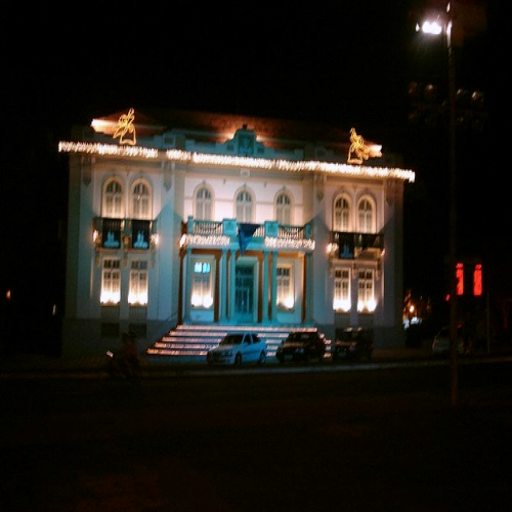

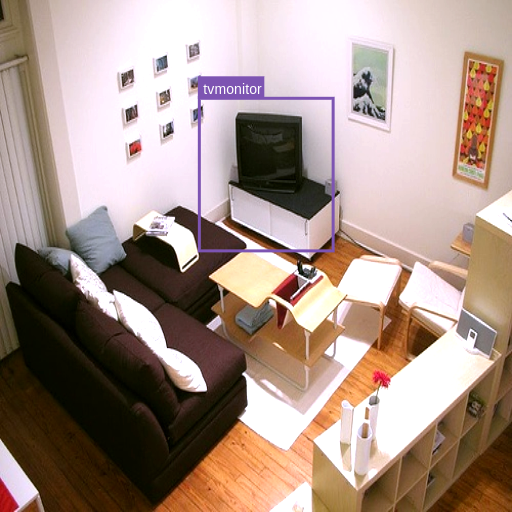

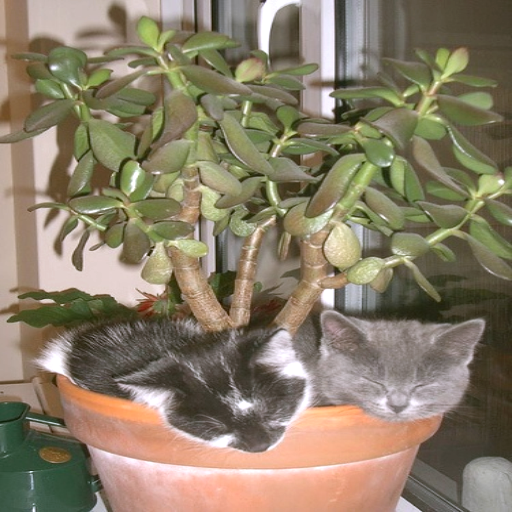

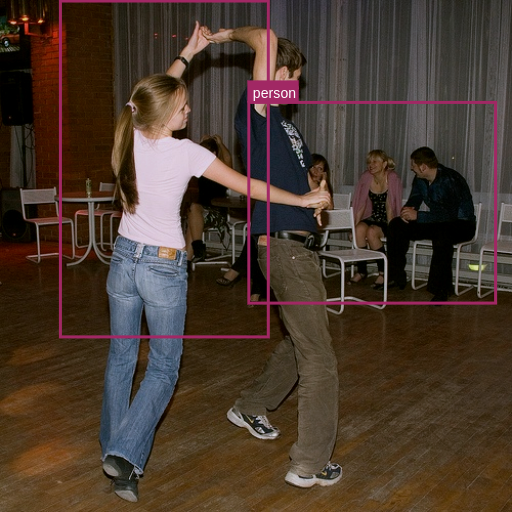

Below are some of the classifications after the last epoch of training